In [3]:
### Task to predict whether person whether person is earning ($50,000 or less) or greater than $50,000??

## <=50K-->>earning $50,000 or less
## >50K-->> earning more than $50,000

In [4]:
# import preprocessing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# module to convert the country names to its ISO codes
import pycountry

# plot the heatmap of each native country
# install folium by running: pip install folium
import folium
from folium.plugins import HeatMap
import plotly.express as px  # for data visualization

# data preprocessing
from sklearn.preprocessing import LabelEncoder

# filter unwanted warning
import warnings

# import ML libraries.
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve, roc_curve, auc
from sklearn.model_selection import cross_val_score
import os
import graphviz
from sklearn.tree import export_graphviz, DecisionTreeClassifier

In [5]:
# filter unwanted warning
# import warnings
warnings.filterwarnings('ignore')

In [6]:
# Read the dataset
data = pd.read_csv('adult2.csv')

In [7]:
# the shape of the data
data.shape

(32561, 15)

In [8]:
# visualize the dataset
data.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


As seen from above, some data are missing and set as "?". We need to check number of columns having this and hadle it accordingly. Before that, let's check if there's is Nan is in the data.

In [9]:
# check if there is nan in our dataset
data.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

As there's no nan, we can now deal with the missing values indicated by "?"

In [10]:
# check the columns having "?"
data[data == '?'].count()

age                  0
workclass         1836
fnlwgt               0
education            0
education.num        0
marital.status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital.gain         0
capital.loss         0
hours.per.week       0
native.country     583
income               0
dtype: int64

The result indicated that workclass, occupation, and native.country has the missing value indicated by "?". Let's deal with this.

In [11]:
# change all the missing value "?" with nan
data[data == '?'] = np.nan

In [12]:
# display the dataset again
data.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,NaN,77053,HS-grad,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,NaN,186061,Some-college,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [13]:
# check if "?" is still present in our data
data[data == '?'].count()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

This shows that we don't have "?" missing value anymore in our dataset.

In [14]:
# check that we now have nan values in our dataset
data.isna().sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education.num        0
marital.status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital.gain         0
capital.loss         0
hours.per.week       0
native.country     583
income               0
dtype: int64

In [15]:
# check dataset information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       30725 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      30718 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  31978 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [16]:
# display column with NaN values
data[data.isnull().any(axis=1)]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,NaN,77053,HS-grad,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,<=50K
2,66,NaN,186061,Some-college,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,<=50K
9,41,Private,70037,Some-college,10,Never-married,Craft-repair,Unmarried,White,Male,0,3004,60,NaN,>50K
14,51,NaN,172175,Doctorate,16,Never-married,NaN,Not-in-family,White,Male,0,2824,40,United-States,>50K
18,22,Private,119592,Assoc-acdm,12,Never-married,Handlers-cleaners,Not-in-family,Black,Male,0,2824,40,NaN,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,NaN,320084,Bachelors,13,Married-civ-spouse,NaN,Wife,White,Female,0,0,55,United-States,>50K
32534,30,NaN,33811,Bachelors,13,Never-married,NaN,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,<=50K
32541,71,NaN,287372,Doctorate,16,Married-civ-spouse,NaN,Husband,White,Male,0,0,10,United-States,>50K
32543,41,NaN,202822,HS-grad,9,Separated,NaN,Not-in-family,Black,Female,0,0,32,United-States,<=50K


Observation: The table shows that there are high corresponding missing values in the occupation and workclass column. The table shows us that most of the missing values are from the majority class, indicating that we can probably remove them without losing important information. When will check the complete rows (without missing information) on the entire data set to check how much of the total rows they represent.

In [17]:
# calculate the percentage of missing data
length_NaN = len(data[data.isnull().any(axis=1)]) # length of missing data
total_length = len(data)                          # length of total dataset

percentage_missing_data = (length_NaN / total_length) * 100
percentage_nonmissing_data = ((total_length - length_NaN) / total_length) * 100

print("Percentage of missing data is: {0:.2f}%".format(percentage_missing_data))
print("Percentage of non missing values is: {0:.2f}%".format(percentage_nonmissing_data))

Percentage of missing data is: 7.37%
Percentage of non missing values is: 92.63%


As shown from above, the rows of missing information only represents 7.4% of our data, so I will be removing them instead of trying to replace and risking skewing our data, but before that, let's check the uniqueness of the missing fields.

## Check Uniqueness of the missing fields

#### workclass field uniqueness

Private             22696
Self-emp-not-inc     2541
Local-gov            2093
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64


<AxesSubplot:>

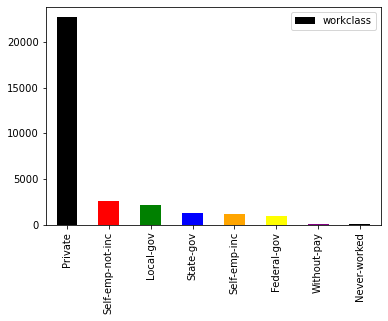

In [18]:
#check with "workclass" column , unique value
workclass_count = data.workclass.value_counts()
print(workclass_count)
colors = ["black","red", "green", "blue", "orange", "yellow", "purple"] 
workclass_count.plot.bar(color=colors,legend=True)

#def unique():
#    print('{} has unique value counts:'.format)
    

In [19]:
# percentage of each workclass
print((workclass_count*100)/workclass_count.sum())

Private             73.868186
Self-emp-not-inc     8.270138
Local-gov            6.812042
State-gov            4.224573
Self-emp-inc         3.632221
Federal-gov          3.124491
Without-pay          0.045566
Never-worked         0.022783
Name: workclass, dtype: float64


Observation:
    This shows the number count of workclass and 'Private' having 74%. The Without-pay and Never-Worked has the lowest value

#### occupation field uniqueness

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: occupation, dtype: int64


<AxesSubplot:>

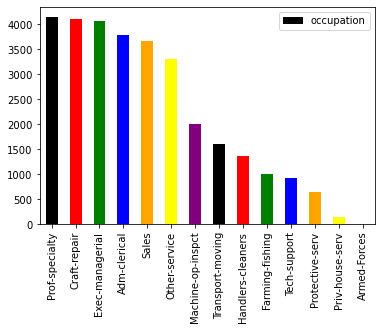

In [20]:
#check with "Occupation" column , unique value
print(data.occupation.value_counts())
colors = ["black","red", "green", "blue", "orange", "yellow", "purple"] 
data.occupation.value_counts().plot.bar(color=colors,legend=True)

In [21]:
# percentage of each occupation
print((data.occupation.value_counts()*100)/data.occupation.value_counts().sum())

Prof-specialty       13.477440
Craft-repair         13.343968
Exec-managerial      13.236539
Adm-clerical         12.272934
Sales                11.882284
Other-service        10.726610
Machine-op-inspct     6.517351
Transport-moving      5.198906
Handlers-cleaners     4.459926
Farming-fishing       3.235888
Tech-support          3.021030
Protective-serv       2.112768
Priv-house-serv       0.485058
Armed-Forces          0.029299
Name: occupation, dtype: float64


The Prof-specialty, Craft-repair, and Exec-managerial have same percentage of unique values of 13%. 

#### native country field uniqueness

United-States                 29170
Mexico                          643
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
Greece                           29
France                      

<AxesSubplot:>

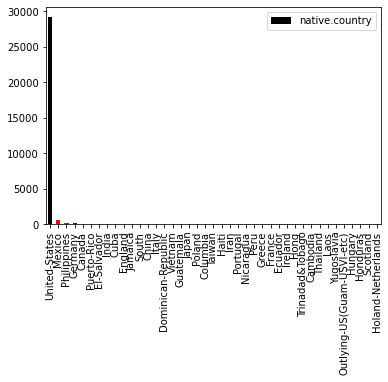

In [22]:
#check with "native.country" column , unique value
print(data["native.country"].value_counts())
colors = ["black","red", "green", "blue", "orange", "yellow", "purple"] 
data["native.country"].value_counts().plot.bar(color=colors,legend=True)

In [23]:
print((data["native.country"].value_counts()*100)/data["native.country"].value_counts().sum())

United-States                 91.218963
Mexico                         2.010757
Philippines                    0.619176
Germany                        0.428420
Canada                         0.378385
Puerto-Rico                    0.356495
El-Salvador                    0.331478
India                          0.312715
Cuba                           0.297079
England                        0.281443
Jamaica                        0.253299
South                          0.250172
China                          0.234536
Italy                          0.228282
Dominican-Republic             0.218900
Vietnam                        0.209519
Guatemala                      0.200138
Japan                          0.193883
Poland                         0.187629
Columbia                       0.184502
Taiwan                         0.159485
Haiti                          0.137595
Iran                           0.134467
Portugal                       0.115705
Nicaragua                      0.106323


As we observe above most of the native.country is United-states having 91%

## Fix the missing value

In [24]:
# remove the missing values from the dataset
data_clean = data.dropna()
data_clean.isna().sum() # check if there is nan

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [25]:
data_clean.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
5,34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,White,Female,0,3770,45,United-States,<=50K
6,38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,White,Male,0,3770,40,United-States,<=50K


In [26]:
# save the processed missed value for future use.
data_clean.to_csv(r'C:\Users\mdhak\Downloads\adult_missing_fixed.csv', index=False)

###### Visualize clean data

In [27]:
# check the shape of new data
data_clean.shape

(30162, 15)

In [28]:
# check the available columns
data_clean.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [29]:
#confirm unique value
# list = ['workclass', 'occupation', 'native.country']
list_column = list(data_clean.columns)
for i in list_column:
    print('{} has unique values as: {} '.format(i, data_clean[i].unique()))
    print('\n')

age has unique values as: [82 54 41 34 38 74 68 45 52 32 46 57 37 29 61 51 21 33 49 23 59 60 63 53
 44 43 48 71 73 40 50 42 39 55 47 31 58 62 36 67 72 78 83 26 70 27 35 81
 66 65 25 28 56 69 20 30 90 24 64 75 19 77 22 80 18 17 79 76 88 84 85 86] 


workclass has unique values as: ['Private' 'State-gov' 'Federal-gov' 'Self-emp-not-inc' 'Self-emp-inc'
 'Local-gov' 'Without-pay'] 


fnlwgt has unique values as: [132870 140359 264663 ...  84661 257302 201490] 


education has unique values as: ['HS-grad' '7th-8th' 'Some-college' '10th' 'Doctorate' 'Prof-school'
 'Bachelors' 'Masters' '11th' 'Assoc-voc' '1st-4th' '5th-6th' 'Assoc-acdm'
 '12th' '9th' 'Preschool'] 


education.num has unique values as: [ 9  4 10  6 16 15 13 14  7 11  2  3 12  8  5  1] 


marital.status has unique values as: ['Widowed' 'Divorced' 'Separated' 'Never-married' 'Married-civ-spouse'
 'Married-spouse-absent' 'Married-AF-spouse'] 


occupation has unique values as: ['Exec-managerial' 'Machine-op-inspct' 'Prof-special

In [30]:
# check data info
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30162 entries, 1 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             30162 non-null  int64 
 1   workclass       30162 non-null  object
 2   fnlwgt          30162 non-null  int64 
 3   education       30162 non-null  object
 4   education.num   30162 non-null  int64 
 5   marital.status  30162 non-null  object
 6   occupation      30162 non-null  object
 7   relationship    30162 non-null  object
 8   race            30162 non-null  object
 9   sex             30162 non-null  object
 10  capital.gain    30162 non-null  int64 
 11  capital.loss    30162 non-null  int64 
 12  hours.per.week  30162 non-null  int64 
 13  native.country  30162 non-null  object
 14  income          30162 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [31]:
data_clean.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
5,34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,White,Female,0,3770,45,United-States,<=50K
6,38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,White,Male,0,3770,40,United-States,<=50K


## Exploratory Data Analysis (EDA)

In [32]:
# check the percentage of income
income_count = data_clean['income'].value_counts()
income_count / income_count.sum()

<=50K    0.751078
>50K     0.248922
Name: income, dtype: float64

#### Workclass by income

In [33]:
# percentage of workclass field
workclass_count = data_clean.workclass.value_counts()
workclass_count/workclass_count.sum()

Private             0.738877
Self-emp-not-inc    0.082853
Local-gov           0.068530
State-gov           0.042404
Self-emp-inc        0.035608
Federal-gov         0.031265
Without-pay         0.000464
Name: workclass, dtype: float64

<AxesSubplot:xlabel='workclass', ylabel='count'>

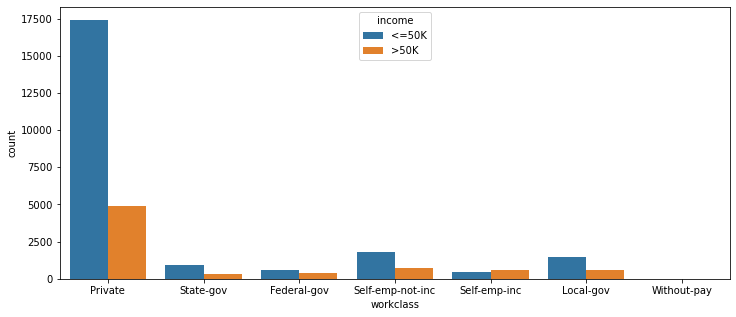

In [34]:
# draw count plot
fig = plt.figure(figsize=(12,5))
sns.countplot(data_clean['workclass'], hue=data_clean['income'])

###### Observations:
1. <=50K earners are highest within Private workclass
2. 50K+ earners are higher than <=50K in only Self-emp-inc level. At all other levels, the trends are reverse.
3. There's no significant description on the without-pay and Never-worked.
4. Data is less than 5% in most places

#### Occupation by income

<AxesSubplot:xlabel='occupation', ylabel='count'>

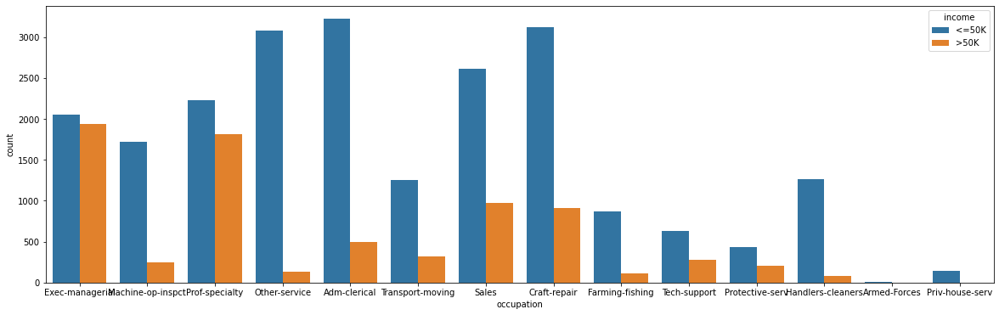

In [35]:
#Checking occupation variable
fig = plt.figure(figsize=(20,6))
sns.countplot(data_clean.occupation, hue=data_clean.income)

In [36]:
occupation_count = data_clean.occupation.value_counts()
occupation_count/occupation_count.sum()

Prof-specialty       0.133877
Craft-repair         0.133612
Exec-managerial      0.132352
Adm-clerical         0.123367
Sales                0.118825
Other-service        0.106492
Machine-op-inspct    0.065181
Transport-moving     0.052119
Handlers-cleaners    0.044758
Farming-fishing      0.032790
Tech-support         0.030237
Protective-serv      0.021351
Priv-house-serv      0.004741
Armed-Forces         0.000298
Name: occupation, dtype: float64

###### Observation:
1. <=50K earners are highest in Prof-specialty, Adm-clerical and Craft repair
2. 50K+ earners are highest in Prof specialty, Exec manager, Sales, and Craft repair
3. <=50k earners are lowest in Priv-house-serv, Armed-Forces, handlers-cleaners and Farming-fishing

#### Native Countries of the earners.

In [37]:
country_count = data_clean['native.country'].value_counts()
country_count/country_count.sum()

United-States                 0.911876
Mexico                        0.020224
Philippines                   0.006233
Germany                       0.004244
Puerto-Rico                   0.003614
Canada                        0.003548
El-Salvador                   0.003315
India                         0.003315
Cuba                          0.003050
England                       0.002851
Jamaica                       0.002652
South                         0.002354
Italy                         0.002254
China                         0.002254
Dominican-Republic            0.002221
Vietnam                       0.002122
Guatemala                     0.002089
Japan                         0.001956
Poland                        0.001857
Columbia                      0.001857
Iran                          0.001392
Taiwan                        0.001392
Haiti                         0.001392
Portugal                      0.001127
Nicaragua                     0.001094
Peru                     

In [38]:
# native country of people earning <=50K
native_country_data = data_clean[data_clean['income'] == '<=50K']['native.country'].value_counts().reset_index()

In [39]:
# Diplay the data
native_country_data

,index,native.country
0,United-States,20509
1,Mexico,577
2,Philippines,128
3,Puerto-Rico,97
4,El-Salvador,91
5,Germany,84
6,Canada,71
7,Jamaica,70
8,Cuba,67
9,Dominican-Republic,65


In [40]:
# change the column name 
native_country_data.columns = ['native_country', 'No of people']
native_country_data

,native_country,No of people
0,United-States,20509
1,Mexico,577
2,Philippines,128
3,Puerto-Rico,97
4,El-Salvador,91
5,Germany,84
6,Canada,71
7,Jamaica,70
8,Cuba,67
9,Dominican-Republic,65


In [41]:
# module to convert the country names to its ISO codes
# import pycountry

In [42]:
# change the native country to list
native_country_list = native_country_data['native_country'].tolist()
native_country_list

['United-States',
 'Mexico',
 'Philippines',
 'Puerto-Rico',
 'El-Salvador',
 'Germany',
 'Canada',
 'Jamaica',
 'Cuba',
 'Dominican-Republic',
 'India',
 'Guatemala',
 'Vietnam',
 'South',
 'England',
 'Columbia',
 'China',
 'Poland',
 'Italy',
 'Haiti',
 'Japan',
 'Nicaragua',
 'Portugal',
 'Peru',
 'Iran',
 'Ecuador',
 'Taiwan',
 'Greece',
 'Ireland',
 'Trinadad&Tobago',
 'Laos',
 'France',
 'Outlying-US(Guam-USVI-etc)',
 'Thailand',
 'Hong',
 'Honduras',
 'Cambodia',
 'Yugoslavia',
 'Hungary',
 'Scotland',
 'Holand-Netherlands']

In [43]:
# convert the country list to ISO code format in order to disply it on the map
countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3

codes = [countries.get(country, 'Unknown code') for country in native_country_list]

print(codes)

['Unknown code', 'MEX', 'PHL', 'Unknown code', 'Unknown code', 'DEU', 'CAN', 'JAM', 'CUB', 'Unknown code', 'IND', 'GTM', 'Unknown code', 'Unknown code', 'Unknown code', 'Unknown code', 'CHN', 'POL', 'ITA', 'HTI', 'JPN', 'NIC', 'PRT', 'PER', 'Unknown code', 'ECU', 'Unknown code', 'GRC', 'IRL', 'Unknown code', 'Unknown code', 'FRA', 'Unknown code', 'THA', 'Unknown code', 'HND', 'KHM', 'Unknown code', 'HUN', 'Unknown code', 'Unknown code']


In [44]:
# convert the list to series
native_country_codes = pd.Series(codes)
# native_country_codes.columns = ['country_code']

In [45]:
# native_country_codes

In [46]:
# add the country code to the country dataset
native_country_data.merge(native_country_codes.rename('country_code'), left_index=True, right_index=True)

,native_country,No of people,country_code
0,United-States,20509,Unknown code
1,Mexico,577,MEX
2,Philippines,128,PHL
3,Puerto-Rico,97,Unknown code
4,El-Salvador,91,Unknown code
5,Germany,84,DEU
6,Canada,71,CAN
7,Jamaica,70,JAM
8,Cuba,67,CUB
9,Dominican-Republic,65,Unknown code


There is a need to andle the "unknown code". We will do this by representing each country as it
supposed to be on the ISO

In [47]:
# {United-States:'USA',Puerto-Rico: 'PRI', El-Salvador:'SLV', Dominican-Republic:'DOM', South:'ZAF', 
# Vietnam:'VNM', England:'GBR', Columbia:'COL', Taiwan:'TWN',Iran:'IRN', Trinadad&Tobago:'TTO', Laos:'LAO', 
# Outlying-US(Guam-USVI-etc):'UMI',Hong:'HKG', Yugoslavia:'YUG', Scotland:'GB-SCT', Holand-Netherlands: 'NLD'  }

In [48]:
# create dictionary of 'unknown code'
country_text = {'United-States':'United States','Puerto-Rico': 'Puerto Rico', 
'El-Salvador':'El Salvador', 'Dominican-Republic':'Dominican Republic',
 'South':'South Africa', 'Vietnam':'Vietnam', 'England':'United Kingdom',
 'Columbia':'Colombia', 'Taiwan':'Taiwan','Iran':'Iran', 'Trinadad&Tobago':'Trinidad and Tobago', 
'Laos':'Laos', 'Outlying-US(Guam-USVI-etc)':'United States Minor Outlying Islands','Hong':'Hong Kong', 
'Yugoslavia':'Yugoslavia', 'Scotland':'Scotland', 'Holand-Netherlands': 'Netherlands'  }

In [49]:
# update the native country with the right representation by ISO
native_country_data['native_country'].replace(to_replace=country_text, inplace=True)

In [50]:
# display the list
native_country_data

,native_country,No of people
0,United States,20509
1,Mexico,577
2,Philippines,128
3,Puerto Rico,97
4,El Salvador,91
5,Germany,84
6,Canada,71
7,Jamaica,70
8,Cuba,67
9,Dominican Republic,65


In [51]:
# convert the country attribute to list
native_country_list = native_country_data['native_country'].tolist()
native_country_list

['United States',
 'Mexico',
 'Philippines',
 'Puerto Rico',
 'El Salvador',
 'Germany',
 'Canada',
 'Jamaica',
 'Cuba',
 'Dominican Republic',
 'India',
 'Guatemala',
 'Vietnam',
 'South Africa',
 'United Kingdom',
 'Colombia',
 'China',
 'Poland',
 'Italy',
 'Haiti',
 'Japan',
 'Nicaragua',
 'Portugal',
 'Peru',
 'Iran',
 'Ecuador',
 'Taiwan',
 'Greece',
 'Ireland',
 'Trinidad and Tobago',
 'Laos',
 'France',
 'United States Minor Outlying Islands',
 'Thailand',
 'Hong Kong',
 'Honduras',
 'Cambodia',
 'Yugoslavia',
 'Hungary',
 'Scotland',
 'Netherlands']

In [52]:
# rerun the country to ISO converter
countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3

codes = [countries.get(country, 'Unknown code') for country in native_country_list]

print(codes)

['USA', 'MEX', 'PHL', 'PRI', 'SLV', 'DEU', 'CAN', 'JAM', 'CUB', 'DOM', 'IND', 'GTM', 'Unknown code', 'ZAF', 'GBR', 'COL', 'CHN', 'POL', 'ITA', 'HTI', 'JPN', 'NIC', 'PRT', 'PER', 'Unknown code', 'ECU', 'Unknown code', 'GRC', 'IRL', 'TTO', 'Unknown code', 'FRA', 'UMI', 'THA', 'HKG', 'HND', 'KHM', 'Unknown code', 'HUN', 'Unknown code', 'NLD']


In [53]:
# modify the country code manually and include the missing country code manually.
complete_codes = ['USA', 'MEX', 'PHL', 'PRI', 'SLV', 'DEU', 'CAN', 'JAM', 'CUB', 'DOM', 'ZAF', 
                  'VNM', 'GTM', 'IND', 'GBR', 'COL', 'CHN', 'POL', 'ITA', 'HTI', 'JPN', 'PRT', 
                  'NIC', 'TWN', 'PER', 'IRN', 'ECU', 'GRC', 'IRL', 'TTO', 'FRA', 'LAO', 'THA', 
                  'UMI', 'HKG', 'KHM', 'HND', 'HUN', 'YUG', 'GB-SCT', 'NLD']

In [54]:
# convert the country code to series
native_country_codes = pd.Series(complete_codes)

In [55]:
# append the code to the native country data
native_country_data = native_country_data.merge(native_country_codes.rename('country_code'), left_index=True, right_index=True)
native_country_data

,native_country,No of people,country_code
0,United States,20509,USA
1,Mexico,577,MEX
2,Philippines,128,PHL
3,Puerto Rico,97,PRI
4,El Salvador,91,SLV
5,Germany,84,DEU
6,Canada,71,CAN
7,Jamaica,70,JAM
8,Cuba,67,CUB
9,Dominican Republic,65,DOM


In [56]:
basemap = folium.Map()   # initialize the map

In [57]:
map_people = px.choropleth(native_country_data,
                          locations=native_country_data['country_code'],
                          color=native_country_data['No of people'],
                          hover_name=native_country_data['country_code'],
                          title='Native Country of People'
                          )
map_people.show()

Data is 91% of USA and not representative enough of other countries.

#### Income by age and gender

<AxesSubplot:xlabel='income', ylabel='age'>

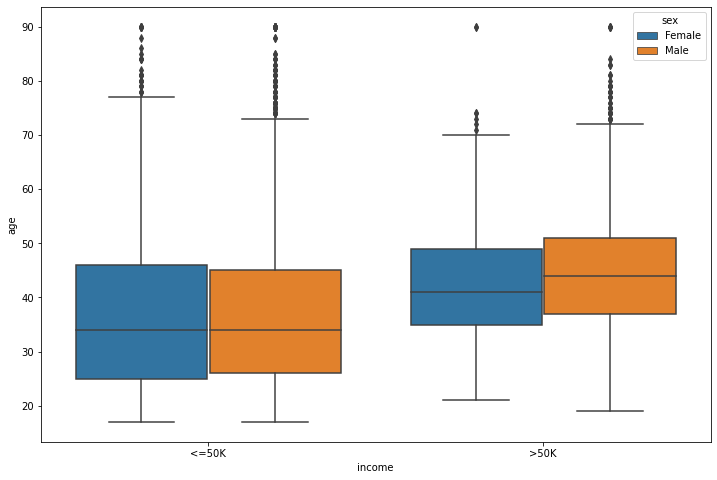

In [58]:
plt.figure(figsize=(12, 8))
sns.boxplot(data_clean.income, data_clean.age, hue=data_clean.sex)


(array([4869., 5579., 5761., 5925., 3810., 2412., 1278.,  359.,  114.,
          55.]),
 array([17. , 24.3, 31.6, 38.9, 46.2, 53.5, 60.8, 68.1, 75.4, 82.7, 90. ]),
 <BarContainer object of 10 artists>)

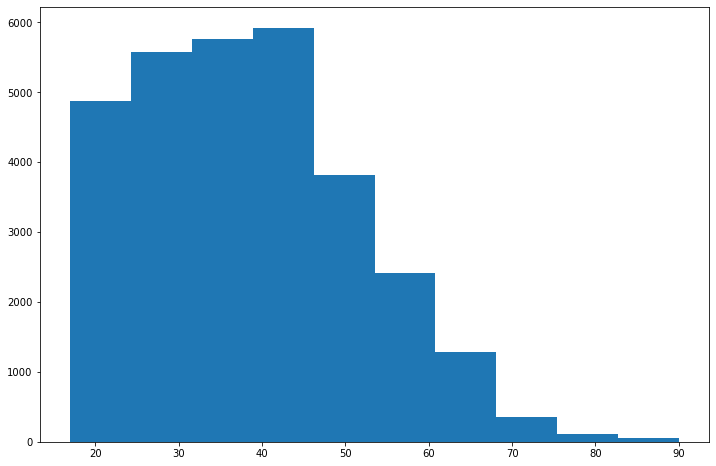

In [59]:
# The histrogram of age
plt.figure(figsize=(12, 8))
plt.hist(data_clean['age'])

###### Observation:
1. Median age of females is slightly lesser than that of men. 
2. Majority of the adults are in the range 35-45 years of age.
3. <=50K seems more right skewed than >50K.
4. Age outliers are present for both genders.

#### Sex

In [60]:
sex_count = data_clean.sex.value_counts()
sex_count/sex_count.sum()

Male      0.675685
Female    0.324315
Name: sex, dtype: float64

###### Observation:
* Male to female ratio is 2:1

#### Marital Status against price

<AxesSubplot:xlabel='marital.status', ylabel='count'>

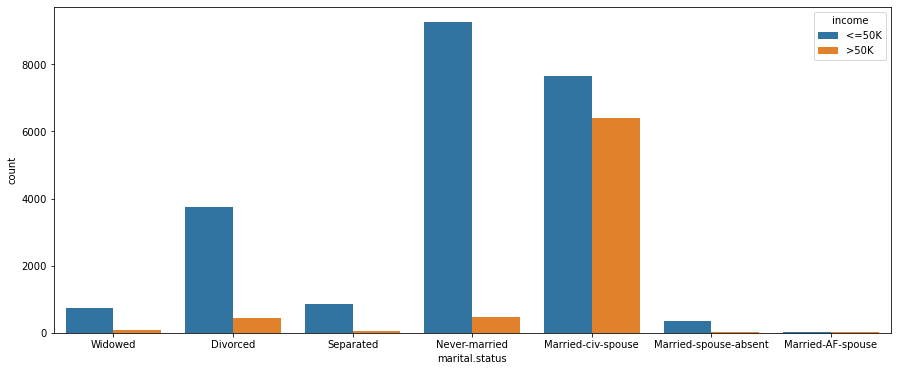

In [61]:
# Checking marital.status variable
fig = plt.figure(figsize=(15,6))
sns.countplot(data_clean['marital.status'], hue=data_clean.income)

###### Observation:
1. <=50K earners are highest across Never married and Married-civ-spouse
2. 50K+ earners are highest across Married civ Spouse and low across others.

In [62]:
marital_status_count = data_clean['marital.status'].value_counts()
marital_status_count/marital_status_count.sum()

Married-civ-spouse       0.466315
Never-married            0.322459
Divorced                 0.139712
Separated                0.031132
Widowed                  0.027419
Married-spouse-absent    0.012267
Married-AF-spouse        0.000696
Name: marital.status, dtype: float64

###### Observation:
* Since income buckets follow similar distribution across all levels and some marital status levels have less than 5% data, we may have to group some levels

#### Education

<AxesSubplot:xlabel='education', ylabel='count'>

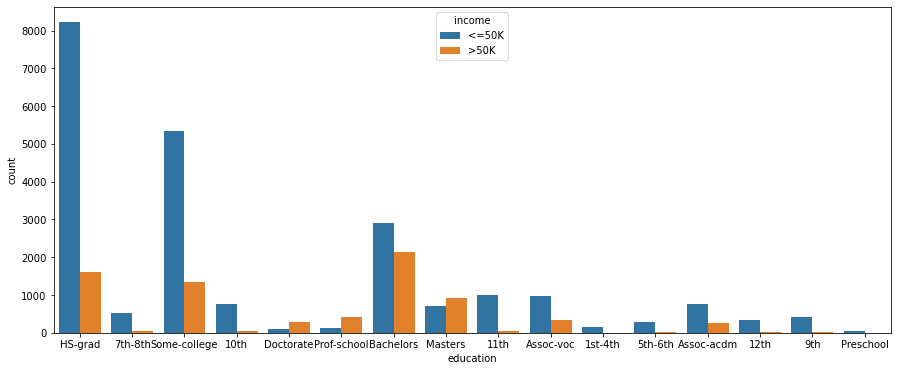

In [63]:
# Checking education variable
fig = plt.figure(figsize=(15,6))
sns.countplot(data_clean['education'], hue=data_clean.income)

In [64]:
edu_count = data_clean['education'].value_counts()
edu_count/edu_count.sum()

HS-grad         0.326238
Some-college    0.221404
Bachelors       0.167230
Masters         0.053942
Assoc-voc       0.043333
11th            0.034746
Assoc-acdm      0.033420
10th            0.027187
7th-8th         0.018467
Prof-school     0.017970
9th             0.015085
12th            0.012499
Doctorate       0.012433
5th-6th         0.009548
1st-4th         0.005006
Preschool       0.001492
Name: education, dtype: float64

<AxesSubplot:xlabel='education.num', ylabel='count'>

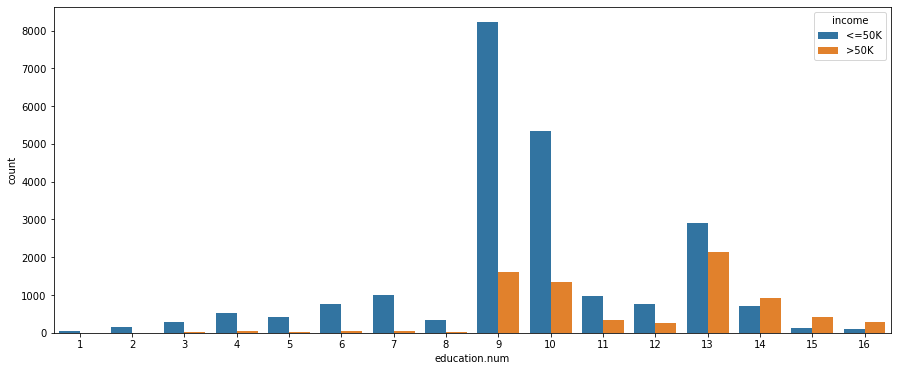

In [65]:
# Checking education variable
fig = plt.figure(figsize=(15,6))
sns.countplot(data_clean['education.num'], hue=data_clean.income)

###### Observation:
* Except for Masters, Prof school and Doctorate, other educations show that <=50K earners are more than 50K+ earners
* Same pattern is followed by occupation.num

In [66]:
education = data_clean[['education', 'education.num']].value_counts()
education/education.sum()

education     education.num
HS-grad       9                0.326238
Some-college  10               0.221404
Bachelors     13               0.167230
Masters       14               0.053942
Assoc-voc     11               0.043333
11th          7                0.034746
Assoc-acdm    12               0.033420
10th          6                0.027187
7th-8th       4                0.018467
Prof-school   15               0.017970
9th           5                0.015085
12th          8                0.012499
Doctorate     16               0.012433
5th-6th       3                0.009548
1st-4th       2                0.005006
Preschool     1                0.001492
dtype: float64

#### Race

<AxesSubplot:xlabel='race', ylabel='count'>

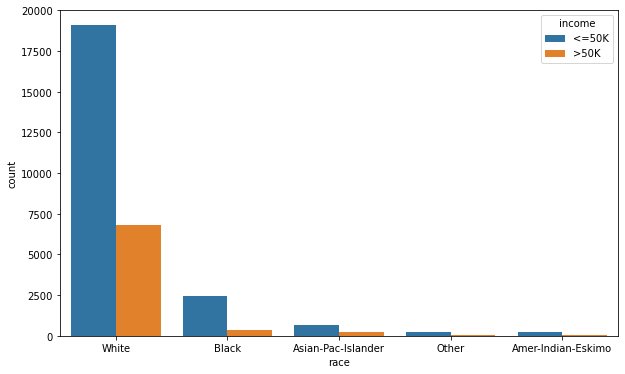

In [67]:
# Checking race variable
fig = plt.figure(figsize=(10,6))
sns.countplot(data_clean['race'], hue=data_clean.income)

In [68]:
race_count = data_clean['race'].value_counts()
race_count/race_count.sum()

White                 0.859790
Black                 0.093396
Asian-Pac-Islander    0.029673
Amer-Indian-Eskimo    0.009482
Other                 0.007659
Name: race, dtype: float64

###### Observation:
* Predominant race levels are White, Black
* Distribution of income buckets is same across all races

#### Hour per week

<AxesSubplot:xlabel='hours.per.week', ylabel='count'>

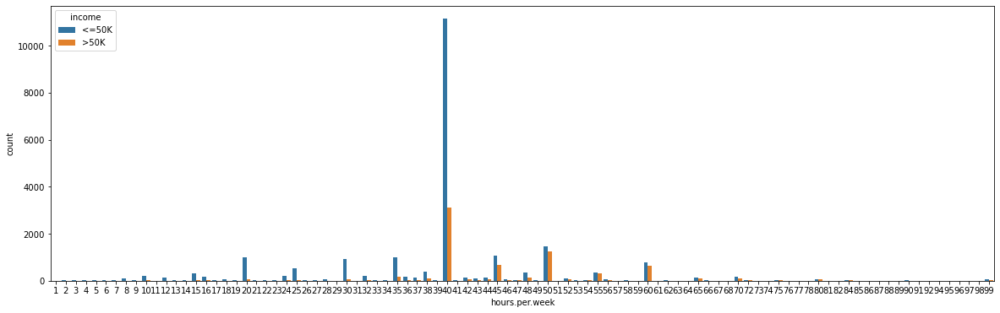

In [69]:
### Hours per week
fig = plt.figure(figsize=(20,6))
sns.countplot(data_clean['hours.per.week'], hue=data_clean.income)

<AxesSubplot:xlabel='income', ylabel='hours.per.week'>

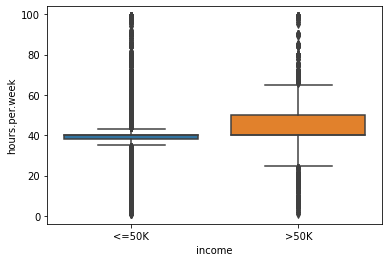

In [70]:
sns.boxplot(data_clean['income'], data_clean['hours.per.week'])

##### Relationship

<AxesSubplot:xlabel='relationship', ylabel='count'>

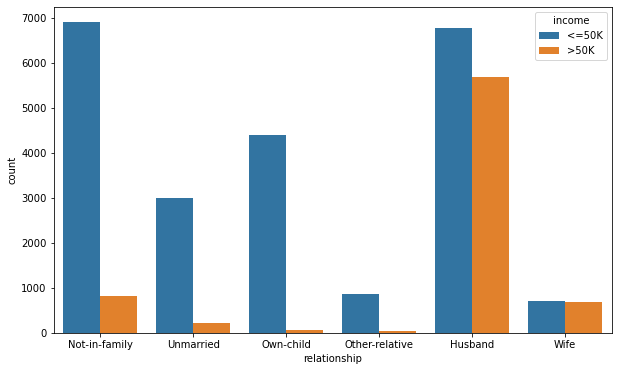

In [71]:
#Relationship metric
fig = plt.figure(figsize=(10,6))
sns.countplot(data_clean['relationship'], hue=data_clean.income)

In [72]:
relationship_count = data_clean[['relationship']].value_counts()
relationship_count/relationship_count.sum()

relationship  
Husband           0.413202
Not-in-family     0.256150
Own-child         0.148067
Unmarried         0.106492
Wife              0.046615
Other-relative    0.029474
dtype: float64

###### Observation:
* Levels have at least 5% data

#### fnlwgt

<AxesSubplot:xlabel='income', ylabel='fnlwgt'>

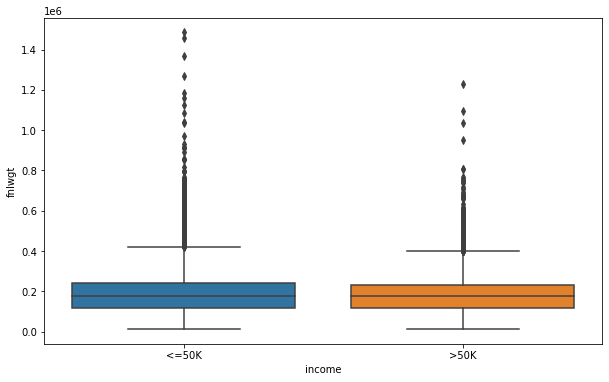

In [73]:
fig = plt.figure(figsize=(10,6))
sns.boxplot(data_clean.income,data_clean['fnlwgt'])

<AxesSubplot:xlabel='fnlwgt'>

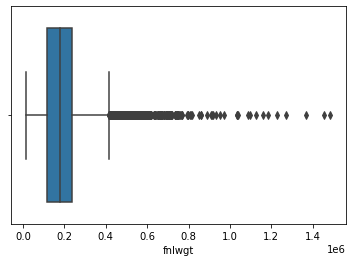

In [74]:
sns.boxplot(data_clean['fnlwgt'])

#### Capital gain

<AxesSubplot:xlabel='income', ylabel='capital.gain'>

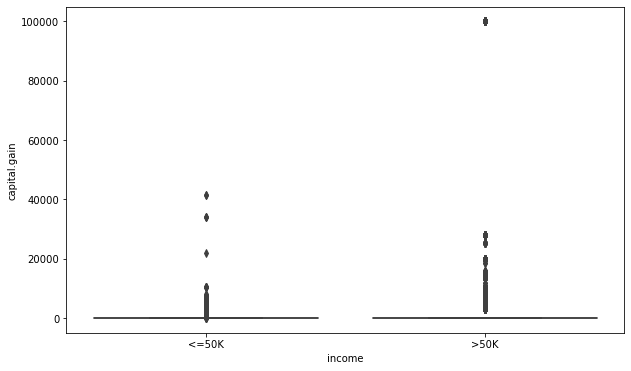

In [75]:
#capital gain
fig = plt.figure(figsize=(10,6))
sns.boxplot(data_clean.income,data_clean['capital.gain'])

<AxesSubplot:xlabel='income', ylabel='capital.loss'>

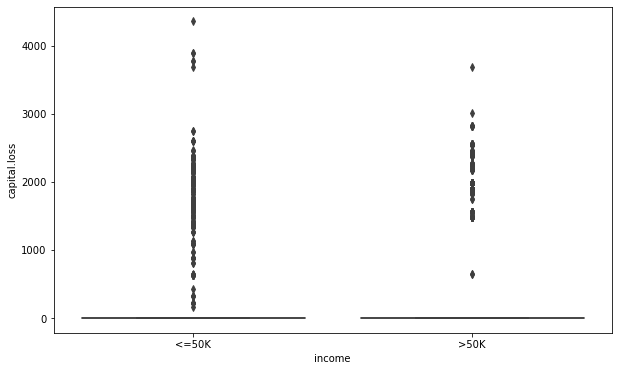

In [76]:
#capital loss
fig = plt.figure(figsize=(10,6))
sns.boxplot(data_clean.income,data_clean['capital.loss'])

#### Extract numerical and categorical column

In [77]:
data_clean.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
5,34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,White,Female,0,3770,45,United-States,<=50K
6,38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,White,Male,0,3770,40,United-States,<=50K


In [78]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30162 entries, 1 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             30162 non-null  int64 
 1   workclass       30162 non-null  object
 2   fnlwgt          30162 non-null  int64 
 3   education       30162 non-null  object
 4   education.num   30162 non-null  int64 
 5   marital.status  30162 non-null  object
 6   occupation      30162 non-null  object
 7   relationship    30162 non-null  object
 8   race            30162 non-null  object
 9   sex             30162 non-null  object
 10  capital.gain    30162 non-null  int64 
 11  capital.loss    30162 non-null  int64 
 12  hours.per.week  30162 non-null  int64 
 13  native.country  30162 non-null  object
 14  income          30162 non-null  object
dtypes: int64(6), object(9)
memory usage: 4.7+ MB


In [79]:
# fun to Extract numerical and categorical column
def extract_cat_num(df):
    cat_col = [col for col in df.columns if df[col].dtype == 'object']
    num_col = [col for col in df.columns if df[col].dtype != 'object']
    return cat_col, num_col

In [80]:
cat_col, num_col = extract_cat_num(data_clean)

In [81]:
cat_col

['workclass',
 'education',
 'marital.status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native.country',
 'income']

In [82]:
num_col

['age',
 'fnlwgt',
 'education.num',
 'capital.gain',
 'capital.loss',
 'hours.per.week']

In [83]:
# Problem Statement:
#1. Analysing distribution of each and every numerical column.
#2. Check label distribution of Categorical data

In [84]:
len(num_col)

6

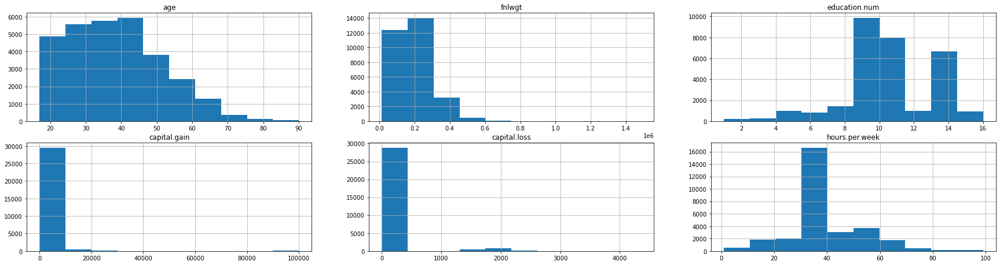

In [85]:
plt.figure(figsize=(30,20))
for i, feature in enumerate(num_col):
    plt.subplot(5,3,i+1)
    data_clean[feature].hist()
    plt.title(feature)

In [86]:
len(cat_col)

9

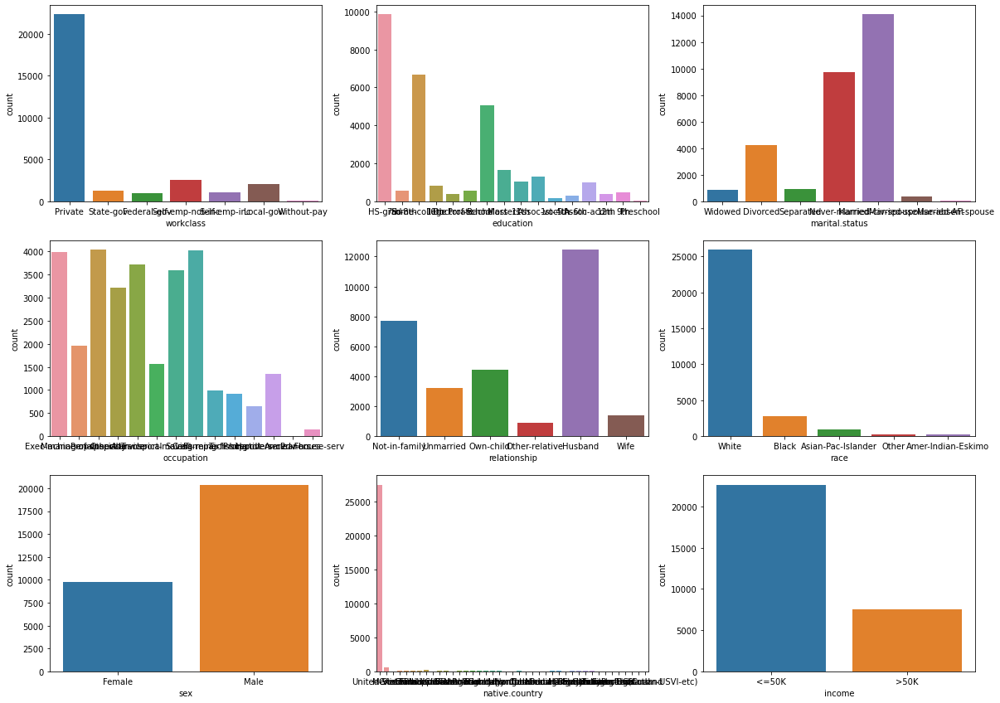

In [87]:
plt.figure(figsize=(20,20))

for i,feature in enumerate(cat_col):
    plt.subplot(4,3,i+1)
    sns.countplot(data_clean[feature])

In [88]:
# How to check co-relation in data
# Problem Statement:
#1. Check how columns are co-related with each other and its 
# impact on Target feature

<AxesSubplot:>

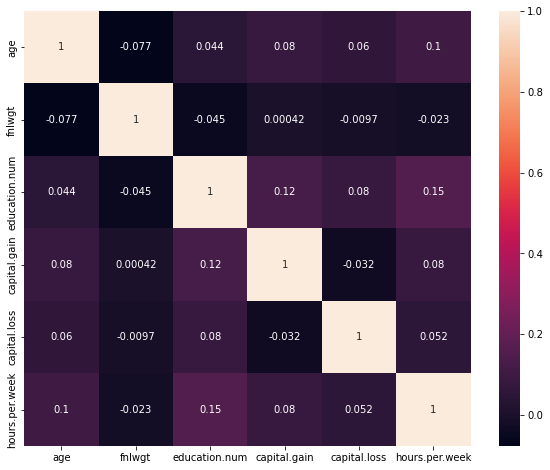

In [89]:
plt.figure(figsize=(10,8))
data_clean.corr()
sns.heatmap(data_clean.corr(), annot=True)

In [90]:
# Applying feature Encoding on data
# Problem statement
# 1. Apply feature Encoding on data

In [91]:
# how many unique categories
for col in cat_col:
    print('{} has {} categories'.format(col, data_clean[col].nunique()))

workclass has 7 categories
education has 16 categories
marital.status has 7 categories
occupation has 14 categories
relationship has 6 categories
race has 5 categories
sex has 2 categories
native.country has 41 categories
income has 2 categories


In [92]:
# As we observe, we can encode the sex and income to have numerical value
# for sex: male = 0, female = 1
# for income: <=50k = 0, >50k = 1
encode ={"sex":{"Male": 0, "Female": 1},
        "income":{"<=50K": 0, ">50K": 1}}
data_clean = data_clean.replace(encode)
data_clean.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,1,0,4356,18,United-States,0
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,1,0,3900,40,United-States,0
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,1,0,3900,40,United-States,0
5,34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,White,1,0,3770,45,United-States,0
6,38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,White,0,0,3770,40,United-States,0


In [93]:
## go with label encoding (for less number of category)

## normal --0
## abnormal --1

In [94]:
le = LabelEncoder()

In [95]:
for col in cat_col:
    data_clean[col] = le.fit_transform(data_clean[col])

In [96]:
data_clean.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,2,132870,11,9,6,3,1,4,1,0,4356,18,38,0
3,54,2,140359,5,4,0,6,4,4,1,0,3900,40,38,0
4,41,2,264663,15,10,5,9,3,4,1,0,3900,40,38,0
5,34,2,216864,11,9,0,7,4,4,1,0,3770,45,38,0
6,38,2,150601,0,6,5,0,4,4,0,0,3770,40,38,0


In [97]:
data_clean.describe(include='all')

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
count,30162.000000,30162.000000,3.016200e+04,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000
mean,38.437902,2.199324,1.897938e+05,10.333764,10.121312,2.580134,5.959850,1.418341,3.678602,0.324315,1092.007858,88.372489,40.931238,36.382567,0.248922
std,13.134665,0.953925,1.056530e+05,3.812292,2.549995,1.498016,4.029566,1.601338,0.834709,0.468126,7406.346497,404.298370,11.979984,6.105372,0.432396
min,17.000000,0.000000,1.376900e+04,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,28.000000,2.000000,1.176272e+05,9.000000,9.000000,2.000000,2.000000,0.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
50%,37.000000,2.000000,1.784250e+05,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
75%,47.000000,2.000000,2.376285e+05,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,45.000000,38.000000,0.000000
max,90.000000,6.000000,1.484705e+06,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,99999.000000,4356.000000,99.000000,40.000000,1.000000


Well, from the column capital-gain, the maximum value is 99999 which seems like little bit werid, we can check the dataset description, the capital-gain means the additional income from capital market, such as stocks, securities, 99999 indicated somebody wrongly imput or it repersented as None additional income, here we can try to replace it with the mean value, and we will replace the 99 hours in the hours-per-week column also

In [98]:
# check the quantity of this outlier
print(f"There's {data_clean[data_clean['capital.gain'] == 99999].shape[0]} outlier in the capital_gain column")
print(f"There's {data_clean[data_clean['hours.per.week'] == 99].shape[0]} outlier in the hours_per_week column")

There's 148 outlier in the capital_gain column
There's 78 outlier in the hours_per_week column


In [99]:
# replace it with mean value
data_clean['capital.gain'].replace(99999, np.mean(data_clean['capital.gain'].values), inplace=True)
data_clean['hours.per.week'].replace(99, np.mean(data_clean['hours.per.week'].values), inplace=True)
# print(data.describe())
data_clean.describe()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
count,30162.000000,30162.000000,3.016200e+04,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000
mean,38.437902,2.199324,1.897938e+05,10.333764,10.121312,2.580134,5.959850,1.418341,3.678602,0.324315,606.687427,88.372489,40.781070,36.382567,0.248922
std,13.134665,0.953925,1.056530e+05,3.812292,2.549995,1.498016,4.029566,1.601338,0.834709,0.468126,2572.012663,404.298370,11.609355,6.105372,0.432396
min,17.000000,0.000000,1.376900e+04,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,28.000000,2.000000,1.176272e+05,9.000000,9.000000,2.000000,2.000000,0.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
50%,37.000000,2.000000,1.784250e+05,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
75%,47.000000,2.000000,2.376285e+05,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,45.000000,38.000000,0.000000
max,90.000000,6.000000,1.484705e+06,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,41310.000000,4356.000000,98.000000,40.000000,1.000000


In [100]:
# As we observe education and education_num both are same , so we can drop one of the column
data_clean.drop(['education'], axis = 1, inplace = True)

In [101]:
from matplotlib import rcParams

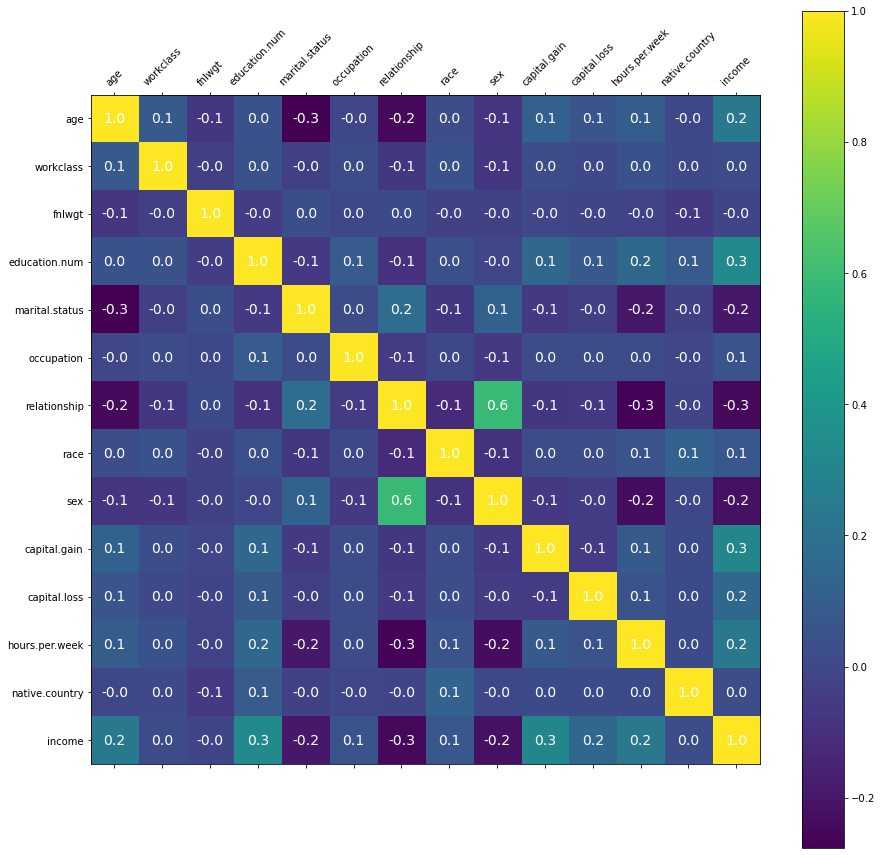

In [102]:
# ploting the correlation between the output(income) and individual features
rcParams['figure.figsize'] = 15, 15
plt.matshow(data_clean.corr())
plt.colorbar()
plt.xticks(np.arange(len(data_clean.corr().columns)), data_clean.corr().columns.values, rotation = 45) 
plt.yticks(np.arange(len(data_clean.corr().columns)), data_clean.corr().columns.values) 
for (i, j), corr in np.ndenumerate(data_clean.corr()):
    plt.text(j, i, '{:0.1f}'.format(corr), ha='center', va='center', color='white', fontsize=14)

In [103]:
# As we observe the correlation between Income and native_country ,occupation ,workclass,final_weight is zero.
# dropping ative_country ,occupation ,workclass,final_weight since it has 0 correlation
data_clean.drop(["native.country" ,"occupation" ,"workclass","fnlwgt"], axis = 1, inplace = True)

In [104]:
data_clean.dtypes

age                 int64
education.num       int64
marital.status      int32
relationship        int32
race                int32
sex                 int64
capital.gain      float64
capital.loss        int64
hours.per.week    float64
income              int64
dtype: object

In [105]:
# save the process data for future use.
data_clean.to_csv(r'C:\Users\mdhak\Downloads\adult_cleaned_for_model.csv', index=False)

## Preparing the Data

Setting X and y-axis and splitting the data into train and test respectively.

Since we want to predict the income of individuals, we will drop the ‘income’ column.

In [106]:
# setting x as input features and y as target feature
X = data_clean.drop(['income'], axis=1)
y = data_clean['income']

In [107]:
X.head()

,age,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week
1,82,9,6,1,4,1,0.0,4356,18.0
3,54,4,0,4,4,1,0.0,3900,40.0
4,41,10,5,3,4,1,0.0,3900,40.0
5,34,9,0,4,4,1,0.0,3770,45.0
6,38,6,5,4,4,0,0.0,3770,40.0


In [108]:
y.head()

1    0
3    0
4    0
5    0
6    0
Name: income, dtype: int64

In [109]:
# splitting the data into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [110]:
# print the shape of the train and test dataset
print('X Train: ',X_train.shape)
print('X Test: ',X_test.shape)
print('y Train: ',y_train.shape)
print('y Test: ',y_test.shape)

X Train:  (22621, 9)
X Test:  (7541, 9)
y Train:  (22621,)
y Test:  (7541,)


## Classification Methods

## 1. Decision Tree Classification

In [111]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

## Let’s look at the Decision Tree:

In [147]:
os.environ['PATH'] += os.pathsep + 'C:/Program Files/Graphviz/bin/'
#Path may vary according to your Graphviz location
dot_data = export_graphviz(dt, out_file=None, feature_names=X.columns, filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph
# graph

## Feature Importance

By all methods examined before the most important feature is “gill-color”.

Let’s visualize it:

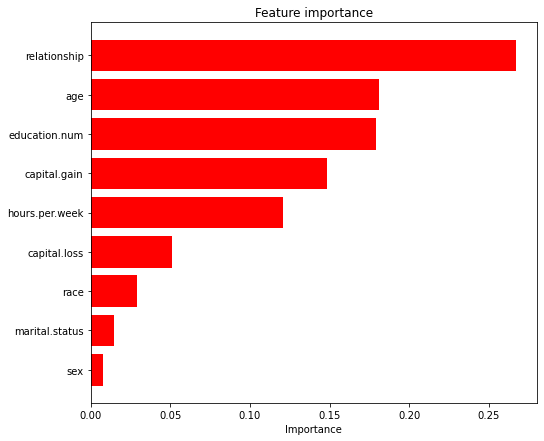

In [113]:
features_list = X.columns.values
feature_importance = dt.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(8,7))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center', color ="red")
plt.yticks(range(len(sorted_idx)), features_list[sorted_idx])
plt.xlabel('Importance')
plt.title('Feature importance')
plt.draw()
#plt.savefig("featureimp.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

### Predicting and estimating the result

In [114]:
y_pred_dt = dt.predict(X_test)
print("Decision Tree Classifier report: \n\n", classification_report(y_test, y_pred_dt))
print("Test Accuracy: {}%".format(round(dt.score(X_test, y_test)*100, 2)))

Decision Tree Classifier report: 

               precision    recall  f1-score   support

           0       0.86      0.90      0.88      5649
           1       0.65      0.56      0.60      1892

    accuracy                           0.81      7541
   macro avg       0.75      0.73      0.74      7541
weighted avg       0.81      0.81      0.81      7541

Test Accuracy: 81.41%


## Confusion Matrix for Decision Tree Classifier

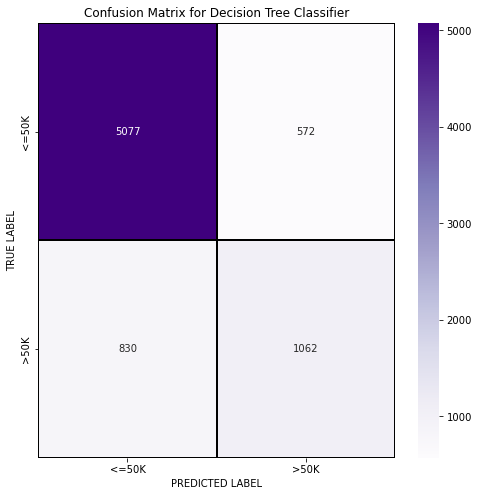

In [115]:
cm = confusion_matrix(y_test, y_pred_dt)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
#plt.savefig("dtcm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

## 2. Logistic Regression Classification

In [116]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver="lbfgs", max_iter=500)
lr.fit(X_train, y_train)
print("Test Accuracy: {}%".format(round(lr.score(X_test, y_test)*100,2)))

Test Accuracy: 80.68%


## Classification report of Logistic Regression Classifier

In [117]:
y_pred_lr = lr.predict(X_test)
print("Logistic Regression Classifier report: \n\n", classification_report(y_test, y_pred_lr))

Logistic Regression Classifier report: 

               precision    recall  f1-score   support

           0       0.82      0.94      0.88      5649
           1       0.70      0.40      0.51      1892

    accuracy                           0.81      7541
   macro avg       0.76      0.67      0.69      7541
weighted avg       0.79      0.81      0.79      7541



## Confusion Matrix for Logistic Regression Classifier

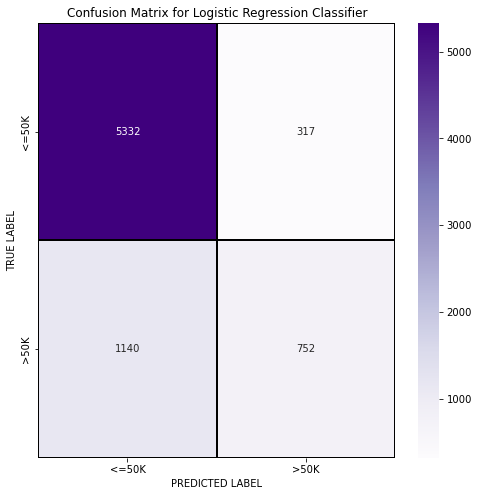

In [118]:
cm = confusion_matrix(y_test, y_pred_lr)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
#plt.savefig("lrcm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

## 3. KNN Classification

In [119]:
from sklearn.neighbors import KNeighborsClassifier
best_Kvalue = 0
best_score = 0
for i in range(1,10):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    if knn.score(X_test, y_test) > best_score:
        best_score = knn.score(X_train, y_train)
        best_Kvalue = i
        
print("Best KNN Value: {}".format(best_Kvalue))
print("Test Accuracy: {}%".format(round(best_score*100,2)))

Best KNN Value: 1
Test Accuracy: 91.43%


## Classification report of KNN Classifier

In [120]:
y_pred_knn = knn.predict(X_test)
print("KNN Classifier report: \n\n", classification_report(y_test, y_pred_knn))

KNN Classifier report: 

               precision    recall  f1-score   support

           0       0.88      0.92      0.90      5649
           1       0.72      0.61      0.66      1892

    accuracy                           0.84      7541
   macro avg       0.80      0.77      0.78      7541
weighted avg       0.84      0.84      0.84      7541



## Confusion Matrix for KNN Classifier

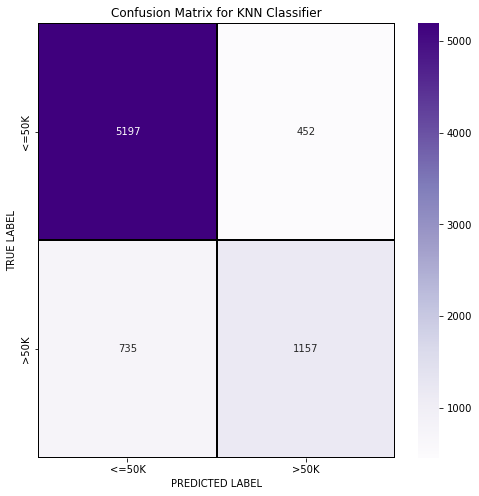

In [121]:
cm = confusion_matrix(y_test, y_pred_knn)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNN Classifier')
#plt.savefig("knncm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

## 4. SVM Classification

In [122]:
from sklearn.svm import SVC
svm = SVC(random_state=42, gamma="auto")
svm.fit(X_train, y_train)
print("Test Accuracy: {}%".format(round(svm.score(X_test, y_test)*100, 2)))

Test Accuracy: 82.69%


## Classification report of SVM Classifier

In [123]:
y_pred_svm = svm.predict(X_test)
print("SVM Classifier report: \n\n", classification_report(y_test, y_pred_svm))

SVM Classifier report: 

               precision    recall  f1-score   support

           0       0.84      0.95      0.89      5649
           1       0.75      0.46      0.57      1892

    accuracy                           0.83      7541
   macro avg       0.80      0.71      0.73      7541
weighted avg       0.82      0.83      0.81      7541



## Confusion Matrix for SVM Classifier

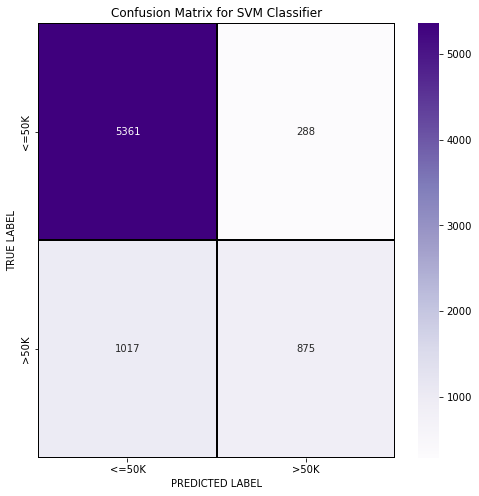

In [124]:
cm = confusion_matrix(y_test, y_pred_svm)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for SVM Classifier')
#plt.savefig("svmcm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

## 5. Naive Bayes Classification

In [125]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_train, y_train)
print("Test Accuracy: {}%".format(round(nb.score(X_test, y_test)*100, 2)))

Test Accuracy: 81.18%


## Classification report of Naive Bayes Classifier

In [126]:
y_pred_nb = nb.predict(X_test)
print("Naive Bayes Classifier report: \n\n", classification_report(y_test, y_pred_nb))

Naive Bayes Classifier report: 

               precision    recall  f1-score   support

           0       0.83      0.94      0.88      5649
           1       0.71      0.42      0.53      1892

    accuracy                           0.81      7541
   macro avg       0.77      0.68      0.70      7541
weighted avg       0.80      0.81      0.79      7541



## Confusion Matrix for Naive Bayes Classifier

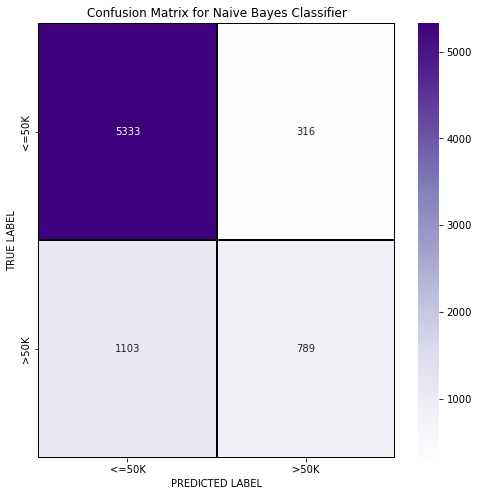

In [127]:
cm = confusion_matrix(y_test, y_pred_nb)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Naive Bayes Classifier')
#plt.savefig("nbcm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

## 6. Random Forest Classification

In [128]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
print("Test Accuracy: {}%".format(round(rf.score(X_test, y_test)*100, 2)))

Test Accuracy: 83.89%


## Classification report of Random Forest Classifier

In [129]:
y_pred_rf = rf.predict(X_test)
print("Random Forest Classifier report: \n\n", classification_report(y_test, y_pred_rf))

Random Forest Classifier report: 

               precision    recall  f1-score   support

           0       0.88      0.92      0.89      5649
           1       0.71      0.61      0.65      1892

    accuracy                           0.84      7541
   macro avg       0.79      0.76      0.77      7541
weighted avg       0.83      0.84      0.83      7541



## Confusion Matrix for Random Forest Classifier

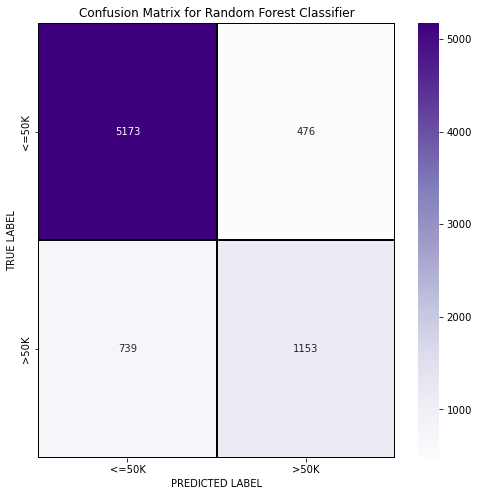

In [130]:
cm = confusion_matrix(y_test, y_pred_rf)
x_axis_labels = ["<=50K", ">50K"]
y_axis_labels = ["<=50K", ">50K"]
f, ax = plt.subplots(figsize =(8,8))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Purples", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier');
#plt.savefig("rfcm.png", format='png', dpi=500, bbox_inches='tight')
plt.show()

In [131]:
models=["Decision Tree Train", "Decision Tree Test", "Logistic Regression Train", "Logistic Regression Test", 
        "KNN Train", "KNN Test", "SVM Train","SVM Test", "Naive Bayes Train", "Naive Bayes Test",
        "Random Forest Train","Random Forest Test"]
scores=[dt.score(X_train,y_train), dt.score(X_test, y_test) , lr.score(X_train,y_train), lr.score(X_test, y_test),
        knn.score(X_train, y_train), knn.score(X_test,y_test), svm.score(X_train,y_train), svm.score(X_test, y_test),
        nb.score(X_train, y_train), nb.score(X_test, y_test), rf.score(X_train,y_train),rf.score(X_test, y_test)]

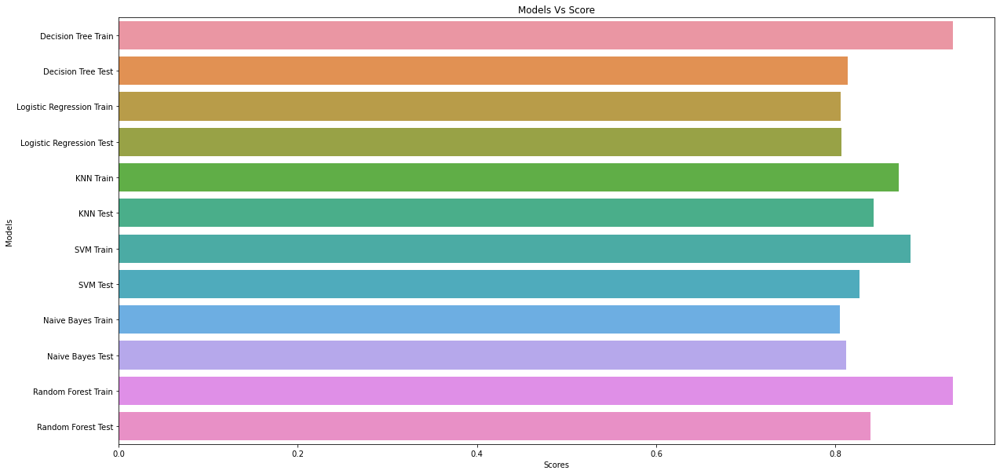

In [132]:
plt.figure(figsize = (20,10))
sns.barplot(x = scores, y=models)
plt.xlabel("Scores")
plt.ylabel("Models")
plt.title("Models Vs Score")
plt.show()

As we can see above, all the Supervised learning algorithm achieve a very high level of accuracy with Decision Tree and Random Forest emerge the best with highest percentage of training while KNN performed best followed by Random Forest in terms of testing.

## 7. K-Means Clustering

In [133]:
from sklearn.cluster import KMeans

We will try to find the optimal number of clusters for our clustering problem. So, as discussed above, here we are going to use the elbow method for this purpose.

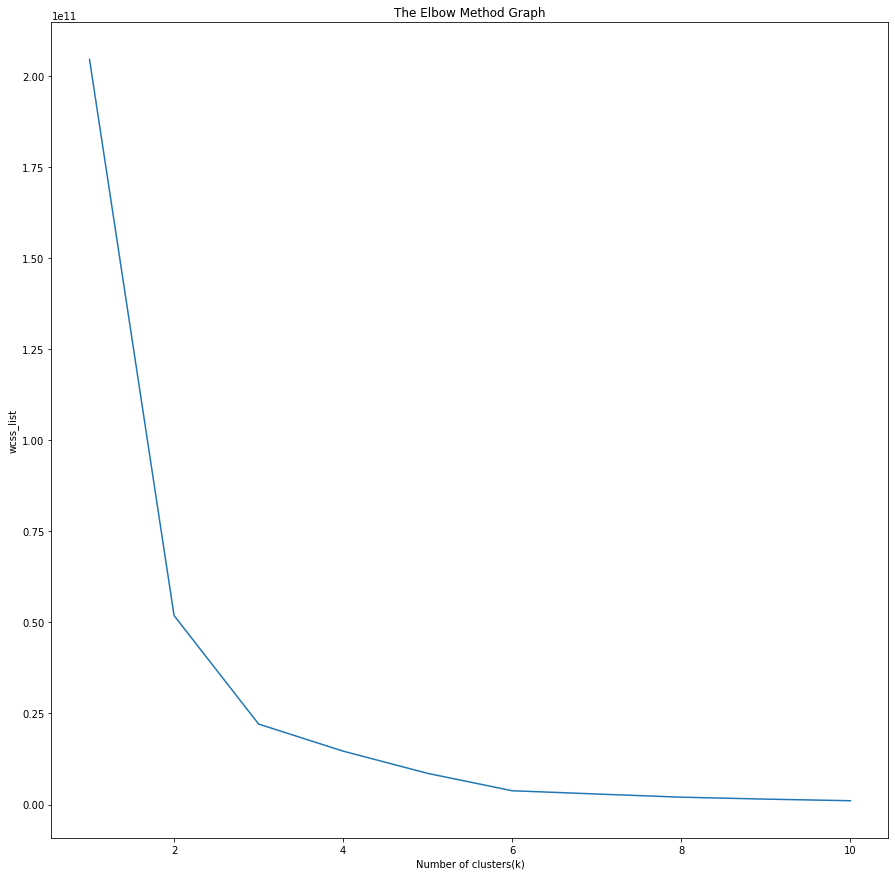

In [134]:
wcss_list= []  #Initializing the list for the values of WCSS  
  
#Using for loop for iterations from 1 to 10.  
for i in range(1, 11):  
    kmeans = KMeans(n_clusters=i, init='k-means++')  
    kmeans.fit(X)  
    wcss_list.append(kmeans.inertia_)  
plt.plot(range(1, 11), wcss_list)  
plt.title('The Elbow Method Graph')  
plt.xlabel('Number of clusters(k)')  
plt.ylabel('wcss_list')  
plt.show()  

In this case, that elbow point seems to be between 2 and 3. Instead of checking this manually, you can employ another technique to obtain the exact number of clusters. 

This can be done using the `KneeLocator` library. It is similar to what we have done above but will result in a precise number of clusters. 

From the above plot, we can see the elbow point is at 3. So the number of clusters here will be 3.

In [135]:
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), wcss_list, curve="convex", direction="decreasing" )

In [136]:
kl.elbow

3

From the above plot and KneeLocator, we can see the elbow point is at 3. So the number of clusters here will be 3.

###### Next step is to build input for the model

In [137]:
data_clean.head()

,age,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,income
1,82,9,6,1,4,1,0.0,4356,18.0,0
3,54,4,0,4,4,1,0.0,3900,40.0,0
4,41,10,5,3,4,1,0.0,3900,40.0,0
5,34,9,0,4,4,1,0.0,3770,45.0,0
6,38,6,5,4,4,0,0.0,3770,40.0,0


In [138]:
#building the input for the model ( 3 attributes :relationship,race, and sex)
x = data_clean.iloc[:, [3, 4, 5]].values

#### The next step is to fit the model and make predictions. 

In [139]:
# Initialize our model with three clusters
kmeans = KMeans(n_clusters= 3, init = 'k-means++') #Initialize the model
# Fit our model on the X dataset
y_kmeans = kmeans.fit_predict(x) # Note that kmeans is unlabelled...

In [140]:
#generated cluster
print(y_kmeans)

[0 1 1 ... 0 1 1]


[[0.40443123 3.99292083 0.16773845]
 [3.62212486 3.64808324 0.65520263]
 [0.88088643 1.4871389  0.27542541]]


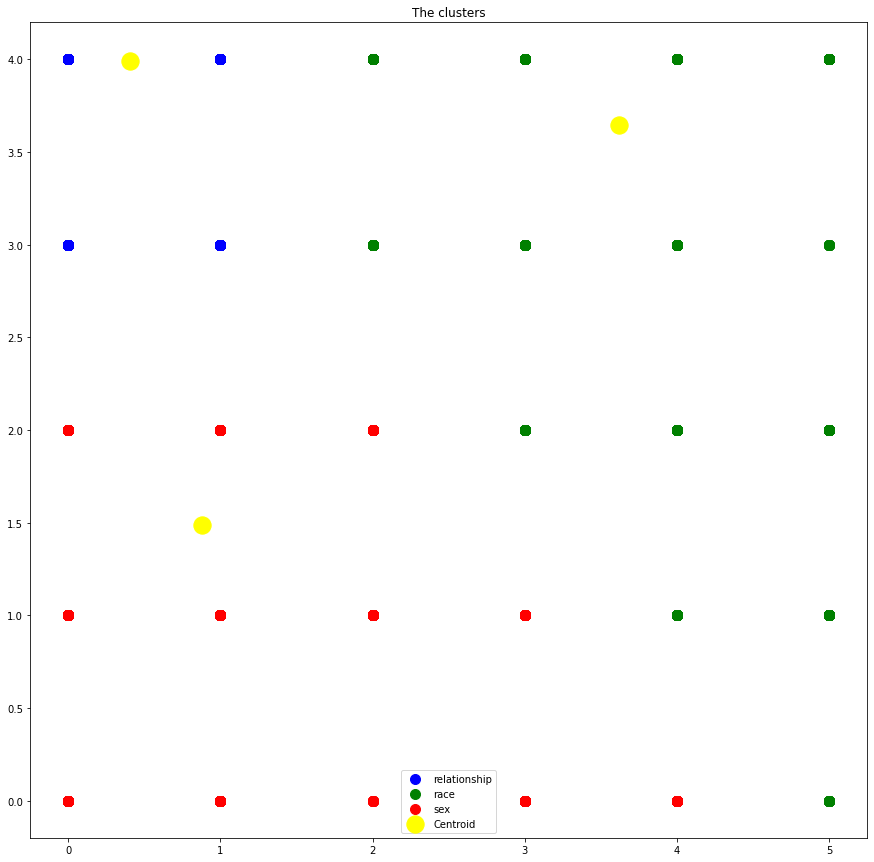

In [141]:
print(kmeans.cluster_centers_) #display cluster centers

#visulaizing the clusters  
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'blue', label = 'relationship') #for first cluster  
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'green', label = 'race') #for second cluster  
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'red', label = 'sex') #for third cluster  
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroid')  # the centroid of the  cluster 
plt.title('The clusters')  
plt.legend()  
plt.show()  

In [142]:
# display the inertial of the model
kmeans.inertia_

25438.631977718684

* The lesser the model inertia, the better the model fit.

* As we can see from the above, the model has very high inertia. So, this is not a good model fit to the data.

In [143]:
# Let's check the quality of the weak of the model

labels = kmeans.labels_

# check how many of the samples were correctly labeled
correct_labels = sum(y == labels)

print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))

Result: 13481 out of 30162 samples were correctly labeled.


In [144]:
# Let's check the accuracy of the model
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Accuracy score: 0.45


We have achieved a weak classification accuracy of 45% by our unsupervised model.

## Let's check the model accuracy with different number of clusters

#### K-Means model with 2 clusters

In [145]:
kmeans = KMeans(n_clusters=2, init = 'k-means++')

kmeans.fit(x)

# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 15046 out of 30162 samples were correctly labeled.
Accuracy score: 0.50


#### K-Means model with 4 clusters

In [146]:
kmeans = KMeans(n_clusters=4, init = 'k-means++')

kmeans.fit(x)

# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 7594 out of 30162 samples were correctly labeled.
Accuracy score: 0.25


Observation: As we can see from the above, we were able to achieve a 50% accuracy with k=2

###### Summary: 

1. Data was downloaded from UCI ML repocitory, imported and its shape was found to be (32561,15)

2. EDA:

 * Observed symbol ‘?’ In the data. Was replaced with np.NaN
 * Nulls were observed in workclass, occupation, native.country. These were treated by removing the rows from the dataset as the total percentage of missing data was 7.37%. This was removed in order to avoid skewness.
 * We explored each feature:
 * The uniqueness of workclass, occupation, native.country was observed before the missing data was removed.
 * After the data was cleaned with the missing values, the new dataset was saved with name "adult_missing_fixed.csv" for future used.
 * After the missing data was removed, we had a new shape of dataset as (30162, 15)
 * The uniqueness of data in each columns was also observed.
 * It was observed that "<=50K" earners are highest within private workclass and data is less than 5% in most cases.
 * Workclass, Occupation, Marital Status and Education has several levels with less than 5% data. 
 * Income by Age and Gender: Median age of females is slightly lesser than that of men. Age outliers are present for both genders. Majority of the adults are in the range 35-45 years of age. <=50K seems more right skewed than >50K
 * Native country: Data is predominantly from USA, the countries was transformed into ISO code in order to visualize the countries of the people by using map from folium module.
 * Male to female ratio is 2:1
 * Hours per week and capital gain : Both have too many outliers and were treated by replacing them with their mean.
 * native.country, occupation, workclass and fnlwgt: were dropped as there was no much correlation with the income.
 * Correlation matrix: no major correlations could be seen between continuous variables
3. Weight of Evidence and IV

 * Insignificant vars are: fnlwgt, capital.gain, capital.loss since IV is less than 0.03 for these
 * Mildly predictive vars are: native.country and race since 0.03 <= IV < 0.1
 * Highly predictive vars are: workclass, hours.per.week, sex, education, occupation, education.num, age, marital.status, relationship
4. Feature elimination - we remove variables that do not have predictive power.

5. We split data into train-test datasets. Since data is is slightly imbalance (75:25 ratio), we ensure to stratify by dependent var

5. We build Decision Tree, Logistic Regression, KNN, SVM, Naive Bayes, and Random Forest model using sklearn for Supervised learning and KMeans cluster for unsuppervised learning algorithm.

 * We predict on train and test data to further evaluate
6. Model evaluation:
 ###### A. Suppervised Learning
  1. Decision Tree	
   * Accuracy of the model on test data is 81.46%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 0 is .86 and recall is .90
   * Decision Tree was plotted
   * Feature Importance of each independent variables was also plotted.
  2. Logistic Regression	
   * Accuracy of the model on test data is 81.63%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 1 is .69 and recall is .48
  3. KNN	
   * Accuracy of the model on test data is 91.31%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 1 is .71 and recall is .63
   * Best KNN value was 1
  4. SVM	
   * Accuracy of the model on test data is 82.69%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 1 is .75 and recall is .46
  5. Naive Bayes	
   * Accuracy of the model on test data is 81.18%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 1 is .71 and recall is .42
  6. Random Forest	
   * Accuracy of the model on test data is 83.89%
   * Confusion matrix and classification report were displayed
   * we see that precision for class 0 is .88 and recall is .92 
 ###### B. Unsuppervised Learning
  7. KMeans cluster
   * Elbow method was used to determine the number of clusters. KneeLocator was used to validate the number of cluster so as to be precise
   * The input for the model was selected as relationship, race, and sex as they contain few numbers of unique values.
   * The model was initialized with 3 clusters and this resulted in accuracy of 45%. 
   * The cluster was visualized on the plot with the indication of their centers.
   * The inertia of 3 clusters was calculated and found at that it was a big value which indicated that it was not a good model fit to the data.
   * The accuracy of different number of clusters was calculated. 2 clusters gave accuracy of 50% and 4 clusters gave 44%.
###### Conclusion: As seen from the test accuracy of the supervised algorithms, we can see that KNN performed best followed by Random Forest. These accuracy are quite high as compared to unsuppervised algorithm(kmeans cluster) with different cluster values.